# Lab04-Image Processing and Analysis

In [1]:
"""
Họ và Tên: Nguyễn Quang Trường
MSSV: 21110429
Phân tích và xử lý ảnh
"""

'\nHọ và Tên: Nguyễn Quang Trường\nMSSV: 21110429\nPhân tích và xử lý ảnh\n'

In [2]:
import numpy as np 
import pandas as pd
import cv2 
from matplotlib import pyplot as plt 
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
from pylab import imread
from skimage.color import rgb2gray
import scipy
import os

In [3]:
def ShowImage(ImageList, nRows = 1, nCols = 2, WidthSpace = 0.00, HeightSpace = 0.00):
    gs = gridspec.GridSpec(nRows, nCols)     
    gs.update(wspace=WidthSpace, hspace=HeightSpace) # set the spacing between axes.
    plt.figure(figsize=(20,10))
    for i in range(len(ImageList)):
        ax1 = plt.subplot(gs[i])
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        ax1.set_aspect('equal')

        plt.subplot(nRows, nCols,i+1)

        image = ImageList[i].copy()
        if (len(image.shape) < 3):
            plt.imshow(image, plt.cm.gray)
        else:
            plt.imshow(image)
        plt.title("Image " + str(i))
        plt.axis('off')

    plt.show()

## Câu 1:

### Chuyển đổi thành ảnh xám 

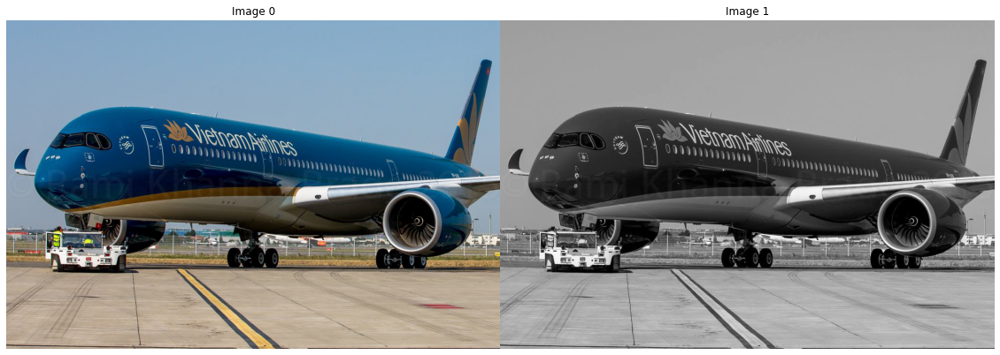

In [4]:
# Read Image 
image_color = imread("May_bay.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
ShowImage([image_color, image_gray], 1, 2)

### Biến đổi DFT và hiển thị ảnh ở miền tần số 

In [5]:
def Image3Dto2D(image):
    if(len(image.shape) >= 3):
        image_2D = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        image_2D = image.copy()
    return image_2D

In [6]:
def DFT_Transformation(image):
    img = Image3Dto2D(image) 

    img_float32 = np.float32(img)
    dft = cv2.dft(img_float32, flags = cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    magnitude_spectrum = 20*np.log(cv2.magnitude(dft_shift[:,:,0],dft_shift[:,:,1]))

    return magnitude_spectrum, dft_shift

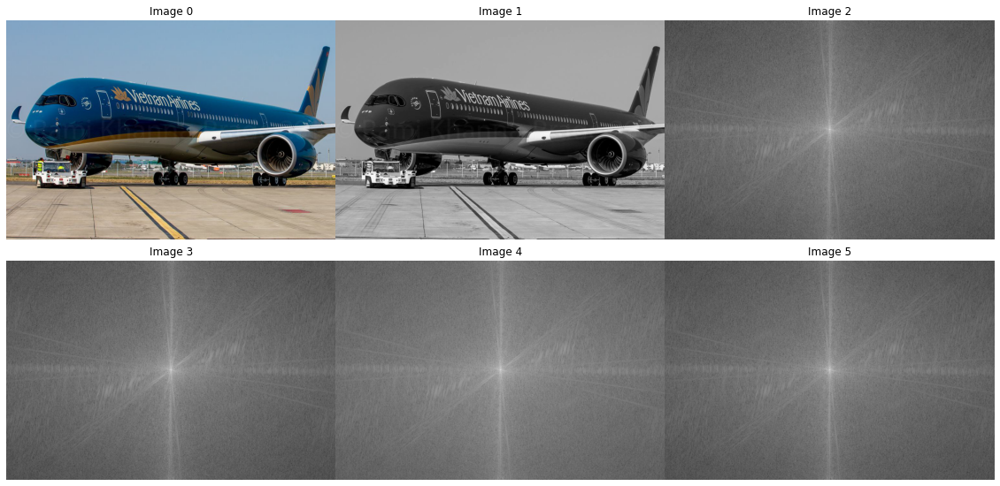

In [7]:
image_dft_frequency, dft_shift = DFT_Transformation(image_gray)
image_dft_frequency1, dft_shift1 = DFT_Transformation(image_color[:,:,0])
image_dft_frequency2, dft_shift2 = DFT_Transformation(image_color[:,:,1])
image_dft_frequency3, dft_shift3 = DFT_Transformation(image_color[:,:,2])
ShowImage([image_color, image_gray,  image_dft_frequency, image_dft_frequency1, image_dft_frequency2, image_dft_frequency3], 2, 3)

### Thực hiện tạo ảnh mask để bỏ miền tần số cao và hiển thị ảnh texture 

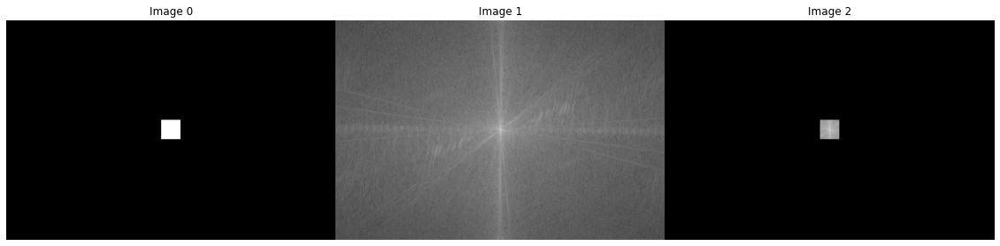

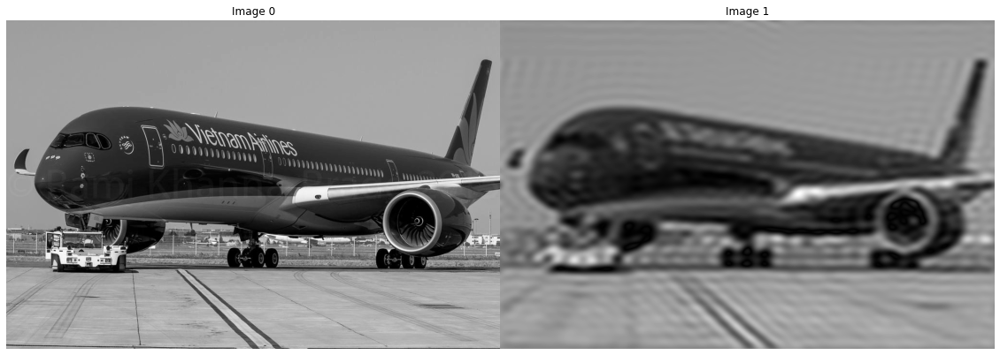

In [8]:
rows, cols = image_gray.shape
crow,ccol = (int)(rows/2) , (int)(cols/2)

# create a mask first, center square is 1, remaining all zeros
mask = np.zeros((rows, cols, 2), np.uint8)
size = 30
mask[crow-size:crow+size, ccol-size:ccol+size] = 1
image_dft_frequency_crop = image_dft_frequency* mask[:,:,0]

# apply mask and inverse DFT
fshift = dft_shift*mask
f_ishift = np.fft.ifftshift(fshift)
img_inverse = cv2.idft(f_ishift)
image_inverse = cv2.magnitude(img_inverse[:,:,0],img_inverse[:,:,1])

ShowImage([mask[:,:,0], image_dft_frequency, image_dft_frequency_crop], 1, 3)
ShowImage([image_gray, image_inverse], 1, 2)

### Thực hiện tạo ảnh mask để bỏ miền tần số thấp và hiển thị ảnh edge 

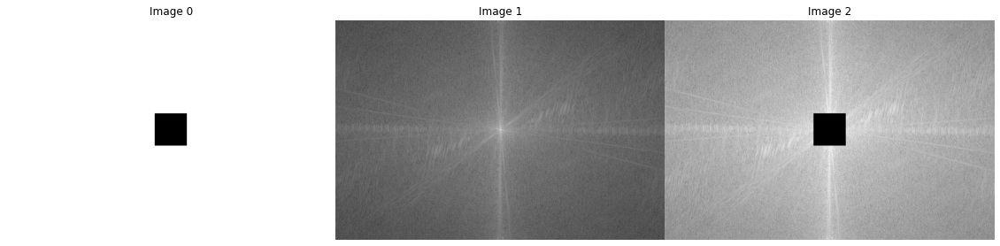

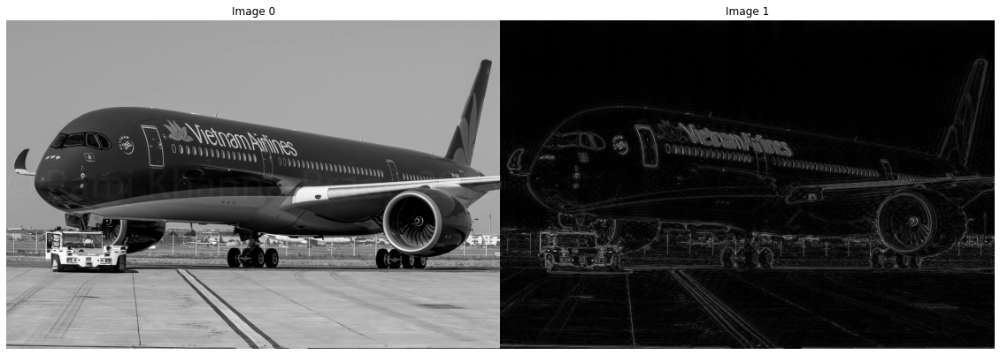

In [9]:
rows, cols = image_gray.shape
crow,ccol = (int)(rows/2) , (int)(cols/2)

# create a mask first, center square is 1, remaining all zeros
mask = np.zeros((rows, cols, 2), np.uint8)
size = 50
mask[crow-size:crow+size, ccol-size:ccol+size] = 1
mask = 1 - mask
image_dft_frequency_crop = image_dft_frequency* mask[:,:,0]

# apply mask and inverse DFT
fshift = dft_shift*mask
f_ishift = np.fft.ifftshift(fshift)
img_inverse = cv2.idft(f_ishift)
image_inverse = cv2.magnitude(img_inverse[:,:,0],img_inverse[:,:,1])

ShowImage([mask[:,:,0], image_dft_frequency, image_dft_frequency_crop], 1, 3)
ShowImage([image_gray, image_inverse], 1, 2)

### Thực hiện tạo ảnh mask và thực hiện thay đổi miền tần số sau đó xuất ảnh kết quả 

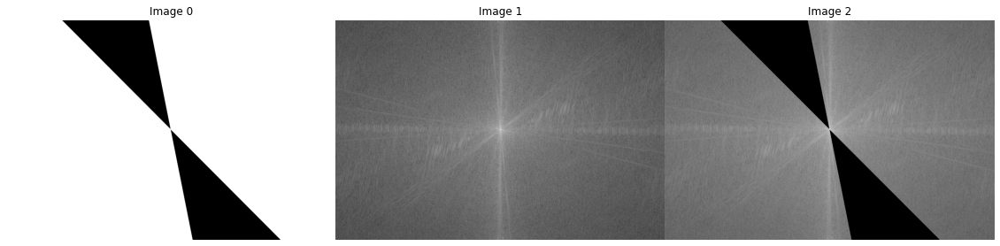

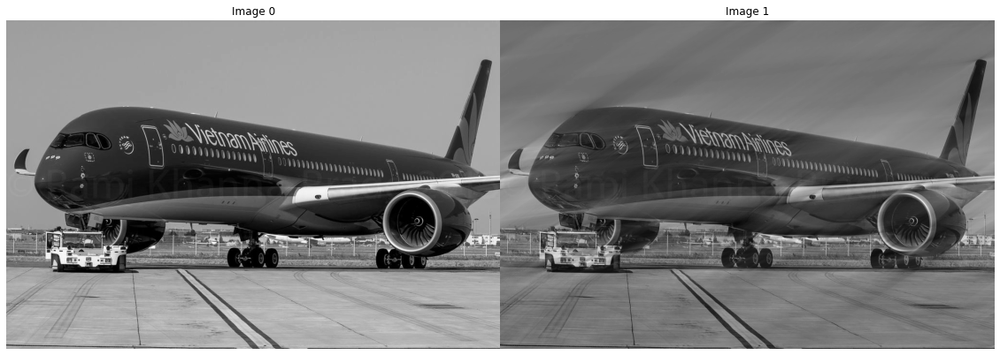

In [10]:
rows, cols = image_gray.shape
crow,ccol = (int)(rows/2) , (int)(cols/2)

# create a mask first, center square is 1, remaining all zeros
mask = np.zeros((rows, cols, 2), np.uint8)
size = 50

f= lambda x: x+ ccol-crow
g= lambda x: 0.2*x + int(ccol-0.2*crow)

for i in range(rows):
    for j in range(cols):
        if j- f(i) >0 and j - g(i)<0:
            mask[i,j]=1
        elif j- f(i) <0 and j- g(i)>0:
            mask[i,j]=1
mask = 1 - mask
image_dft_frequency_crop = image_dft_frequency* mask[:,:,0]

# apply mask and inverse DFT
fshift = dft_shift*mask
f_ishift = np.fft.ifftshift(fshift)
img_inverse = cv2.idft(f_ishift)
image_inverse = cv2.magnitude(img_inverse[:,:,0],img_inverse[:,:,1])

ShowImage([mask[:,:,0], image_dft_frequency, image_dft_frequency_crop], 1, 3)
ShowImage([image_gray, image_inverse], 1, 2)



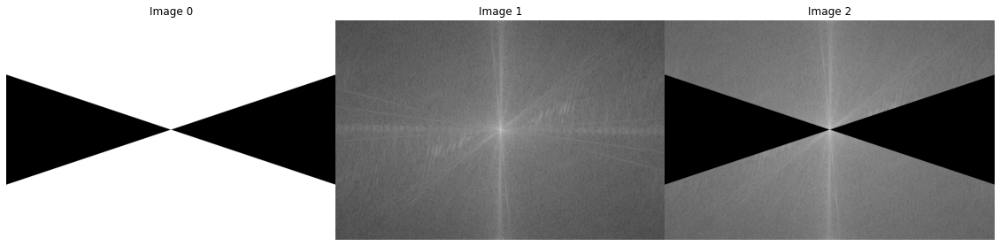

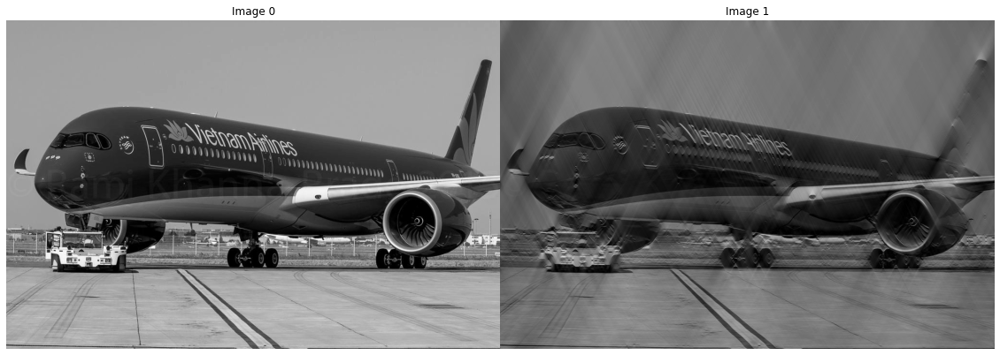

In [11]:
rows, cols = image_gray.shape
crow,ccol = (int)(rows/2) , (int)(cols/2)

# create a mask first, center square is 1, remaining all zeros
mask = np.zeros((rows, cols, 2), np.uint8)
size = 50

f= lambda x: -3*x+ int(ccol+ 3*crow) 
g= lambda x: 3*x - int(3*crow-ccol)  
for i in range(rows):
    for j in range(cols):
        if j- f(i) >0 and  j- g(i)>0:
            mask[i,j]=1
        elif j- f(i) <0 and j- g(i)<0:
            mask[i,j]=1
mask = 1 - mask
image_dft_frequency_crop = image_dft_frequency* mask[:,:,0]

# apply mask and inverse DFT
fshift = dft_shift*mask
f_ishift = np.fft.ifftshift(fshift)
img_inverse = cv2.idft(f_ishift)
image_inverse = cv2.magnitude(img_inverse[:,:,0],img_inverse[:,:,1])

ShowImage([mask[:,:,0], image_dft_frequency, image_dft_frequency_crop], 1, 3)
ShowImage([image_gray, image_inverse], 1, 2)



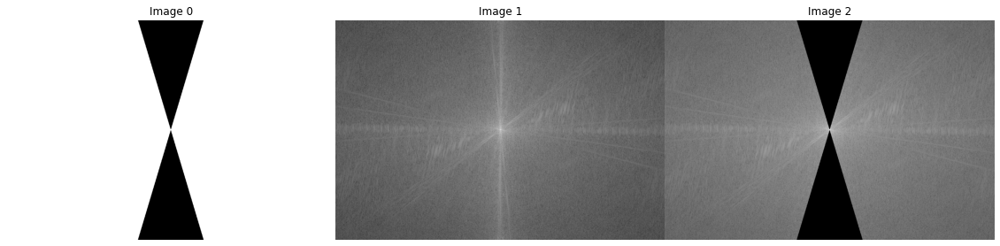

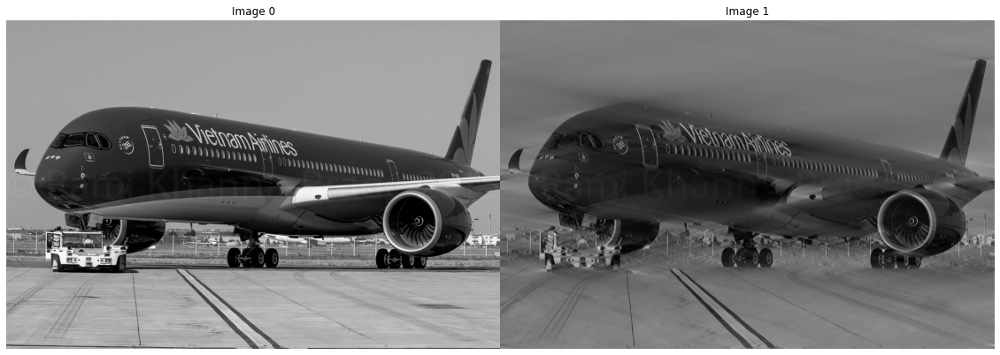

In [12]:
rows, cols = image_gray.shape
crow,ccol = (int)(rows/2) , (int)(cols/2)

# create a mask first, center square is 1, remaining all zeros
mask = np.zeros((rows, cols, 2), np.uint8)
size = 50

f= lambda x: 0.3*x+int(ccol- 0.3*crow) 
g= lambda x: -0.3*x + int(ccol+0.3*crow)  
for i in range(rows):
    for j in range(cols):
        if j- f(i) <0 and  j- g(i)>0:
            mask[i,j]=1
        elif j- f(i) >0 and j- g(i)<0:
            mask[i,j]=1
mask = 1 - mask
image_dft_frequency_crop = image_dft_frequency* mask[:,:,0]

# apply mask and inverse DFT
fshift = dft_shift*mask
f_ishift = np.fft.ifftshift(fshift)
img_inverse = cv2.idft(f_ishift)
image_inverse = cv2.magnitude(img_inverse[:,:,0],img_inverse[:,:,1])

ShowImage([mask[:,:,0], image_dft_frequency, image_dft_frequency_crop], 1, 3)
ShowImage([image_gray, image_inverse], 1, 2)


## Câu 2

### Chuyển đổi thành ảnh xám

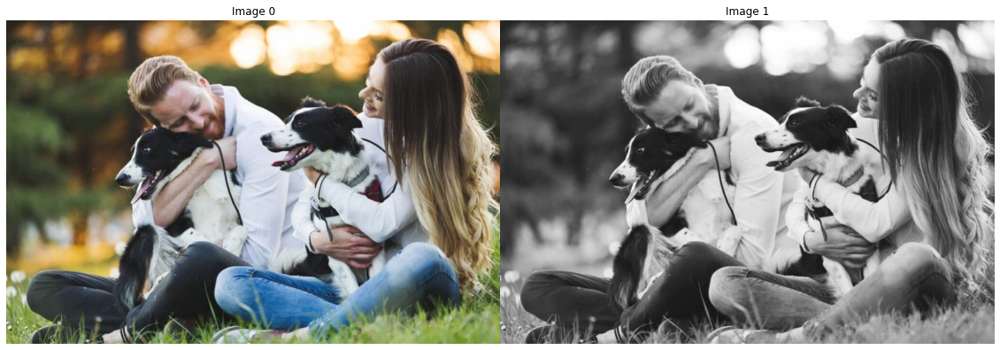

In [13]:
# Read Image 
image_color = imread("dog_people.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
ShowImage([image_color, image_gray], 1, 2)

### Biến đổi DCT và hiển thị ảnh DCT 

In [14]:
from scipy.fftpack import fft, ifft

def dct2(a):
    import scipy
    return scipy.fftpack.dct( scipy.fftpack.dct( a, axis=0, norm='ortho' ), axis=1, norm='ortho' )

def idct2(a):
    import scipy
    return scipy.fftpack.idct( scipy.fftpack.idct( a, axis=0 , norm='ortho'), axis=1 , norm='ortho')

In [15]:
im = image_gray
imsize = im.shape
dct = np.zeros(imsize)

# Do 8x8 DCT on image (in-place)
for i in np.r_[:imsize[0]:8]:
    for j in np.r_[:imsize[1]:8]:
        dct[i:(i+8),j:(j+8)] = dct2( im[i:(i+8),j:(j+8)])

Text(0.5, 1.0, 'An 8x8 DCT block')

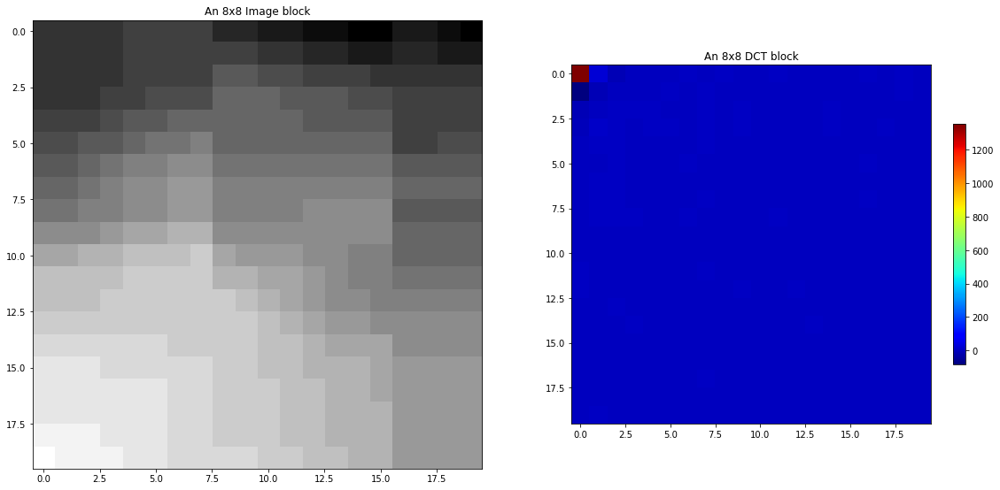

In [16]:
pos = 128
SampleBlock = im[pos:pos+20,pos:pos+20]
SampleDCT = dct2(SampleBlock)

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(SampleBlock,cmap='gray')
plt.title( "An 8x8 Image block")

# Display the dct of that block
plt.subplot(1,2,2)
plt.imshow(SampleDCT,cmap=cm.jet,interpolation='nearest')
plt.colorbar(shrink=0.5)
plt.title( "An 8x8 DCT block")

Text(0.5, 1.0, '8x8 DCTs of the image')

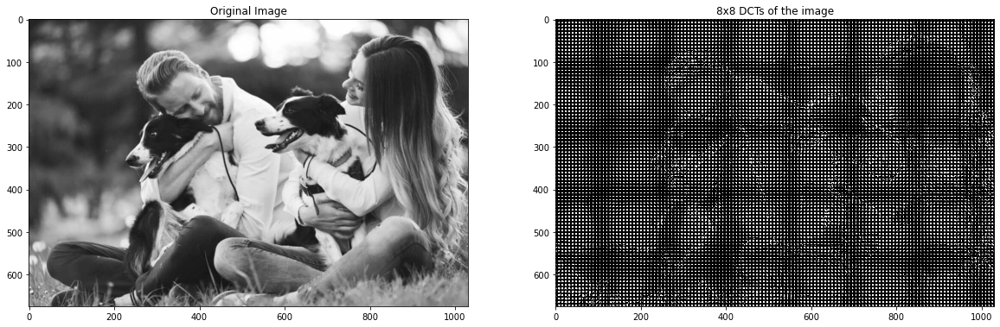

In [17]:
# Display entire DCT
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(image_gray, cmap = 'gray')
plt.title( "Original Image")
plt.subplot(1,2,2)
plt.imshow(dct,cmap='gray',vmax = np.max(dct)*0.01,vmin = 0)
plt.title( "8x8 DCTs of the image")

### 	Đặt ngưỡng giữ lại khoảng 5% hệ số DCT và hiển thị ảnh nén kết quả 

Keeping only 5.360805% of the DCT coefficients
Comparison between original and DCT compressed images


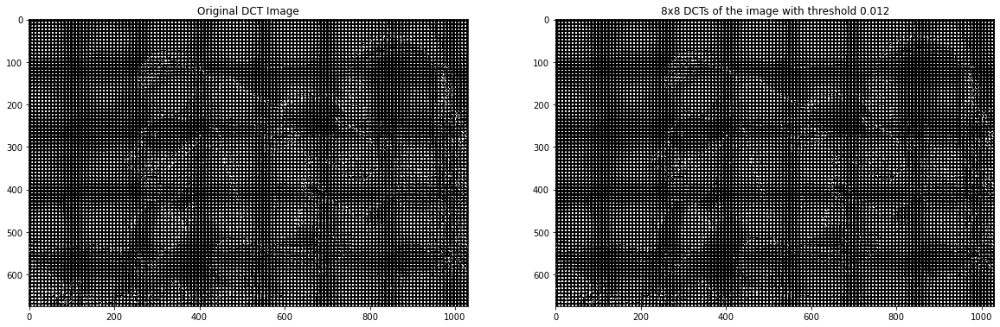

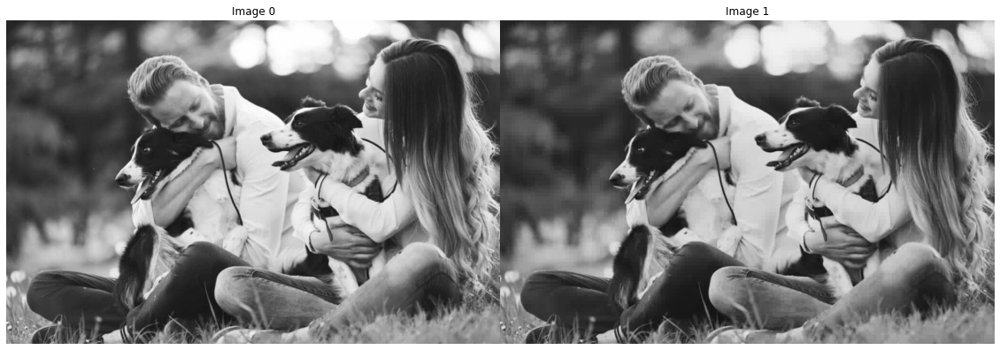

In [18]:
# Threshold
thresh =0.012  #0.012
dct_thresh = dct * (abs(dct) > (thresh*np.max(dct)))

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(dct,cmap='gray',vmax = np.max(dct)*0.01,vmin = 0)
plt.title( "Original DCT Image")
plt.subplot(1,2,2)
plt.imshow(dct_thresh,cmap='gray',vmax = np.max(dct)*0.01,vmin = 0)
plt.title( "8x8 DCTs of the image with threshold " + str(thresh))


percent_nonzeros = np.sum( dct_thresh != 0.0 ) / (imsize[0]*imsize[1]*1.0)
print("Keeping only %f%% of the DCT coefficients" % (percent_nonzeros*100.0))

im_dct = np.zeros(imsize)
for i in np.r_[:imsize[0]:8]:
    for j in np.r_[:imsize[1]:8]:
        im_dct[i:(i+8),j:(j+8)] = idct2( dct_thresh[i:(i+8),j:(j+8)] )
        
print("Comparison between original and DCT compressed images" )
ShowImage([im, im_dct])

## Câu 3

### Thực hiện nén các ảnh dùng DCT bằng cách giữ lại 5% hệ số

In [19]:
image= imread("Nha.jpg")
image_hsv= cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

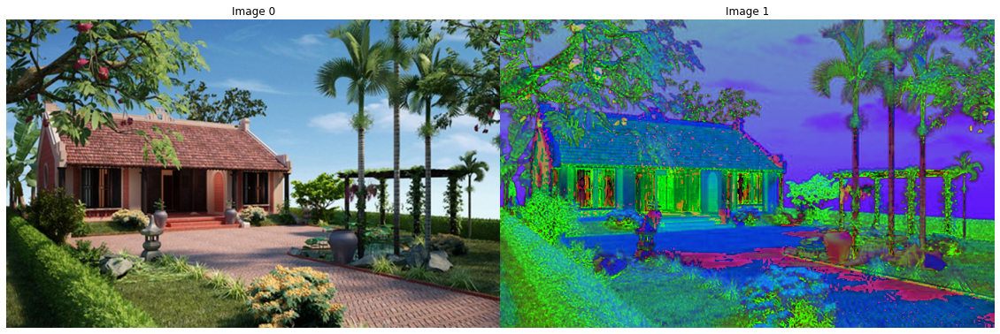

In [20]:
ShowImage([image,image_hsv[:,:,:]],1,2)

In [21]:
def CDT(image_hsv, chanel, thresh):
    
    im = image_hsv[:,:,chanel]
    imsize = im.shape
    dct = np.zeros(imsize)

    # Do 8x8 DCT on image (in-place)
    for i in np.r_[:imsize[0]:8]:
        for j in np.r_[:imsize[1]:8]:
            dct[i:(i+8),j:(j+8)] = dct2( im[i:(i+8),j:(j+8)])

    dct_thresh = dct * (abs(dct) > (thresh*np.max(dct)))

    percent_nonzeros = np.sum( dct_thresh != 0.0 ) / (imsize[0]*imsize[1]*1.0)
    print("Keeping only %f%% of the DCT coefficients" % (percent_nonzeros*100.0))

    im_dct = np.zeros(imsize)
    for i in np.r_[:imsize[0]:8]:
        for j in np.r_[:imsize[1]:8]:
            im_dct[i:(i+8),j:(j+8)] = idct2( dct_thresh[i:(i+8),j:(j+8)] )

    print("Comparison between original and DCT compressed images" )
    ShowImage([im, im_dct])
    
    
    image_hsv[:,:,chanel]=im_dct
    img_RGB = cv2.cvtColor(image_hsv, cv2.COLOR_HSV2RGB)
    
    print("Color image recovery")
    ShowImage([im, img_RGB])
    if chanel==0:
        path="Anh_Nen/AnhNen_CDT_H.jpg"
    elif chanel==1:
        path="Anh_Nen/AnhNen_CDT_S.jpg"
    else:
        path="Anh_Nen/AnhNen_CDT_V.jpg"

    cv2.imwrite(path, cv2.cvtColor(img_RGB,cv2.COLOR_RGB2BGR))


#### Nén các ảnh dùng  DCT ở kênh V 

Keeping only 5.650212% of the DCT coefficients
Comparison between original and DCT compressed images


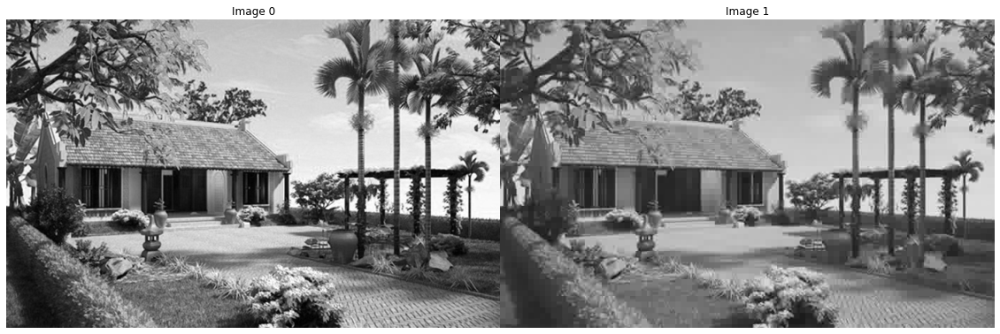

Color image recovery


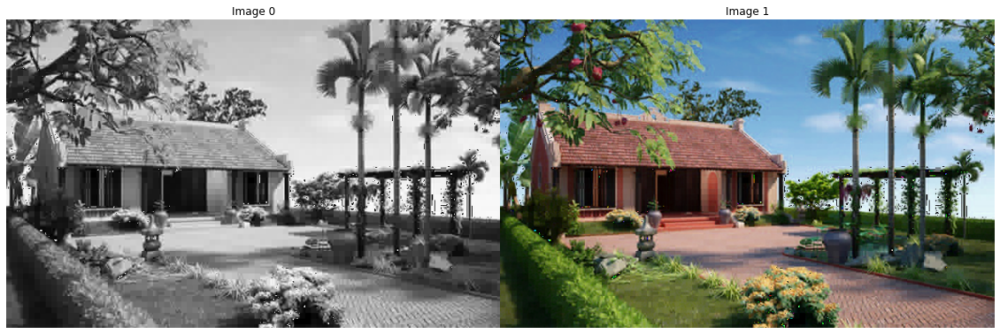

In [22]:
image_hsv= cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
CDT(image_hsv,2,0.03)

In [23]:
size_old=os.path.getsize("Nha.jpg")
size_new=os.path.getsize("Anh_Nen/AnhNen_CDT_V.jpg")
print(f"Dung luong cua anh goc: {size_old}")
print(f"Dung luong anh moi: {size_new}")
print(f"So dung luong giam {size_old-size_new} byte")

Dung luong cua anh goc: 174342
Dung luong anh moi: 120936
So dung luong giam 53406 byte


#### Nén  ảnh  dùng DCT ở kênh H

Keeping only 5.465512% of the DCT coefficients
Comparison between original and DCT compressed images


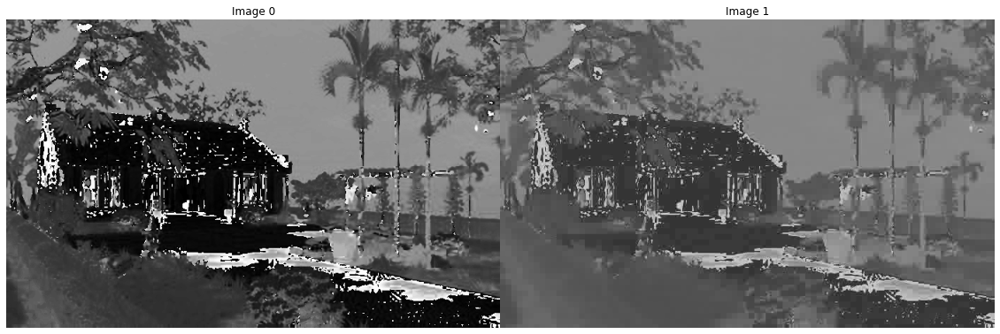

Color image recovery


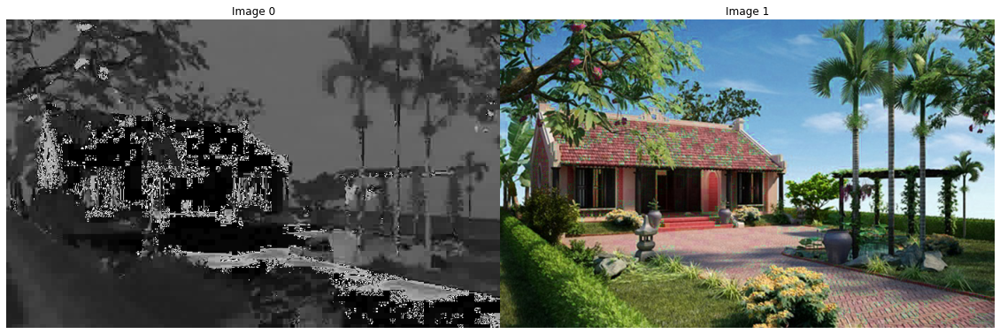

In [24]:
image_hsv= cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
CDT(image_hsv,0,0.04)

In [25]:
size_old=os.path.getsize("Nha.jpg")
size_new=os.path.getsize("Anh_Nen/AnhNen_CDT_H.jpg")
print(f"Dung luong cua anh goc: {size_old}")
print(f"Dung luong anh moi: {size_new}")
print(f"So dung luong giam {size_old-size_new} byte")

Dung luong cua anh goc: 174342
Dung luong anh moi: 171163
So dung luong giam 3179 byte


#### Nén các ảnh dùng DCT ở kênh S

Keeping only 5.192873% of the DCT coefficients
Comparison between original and DCT compressed images


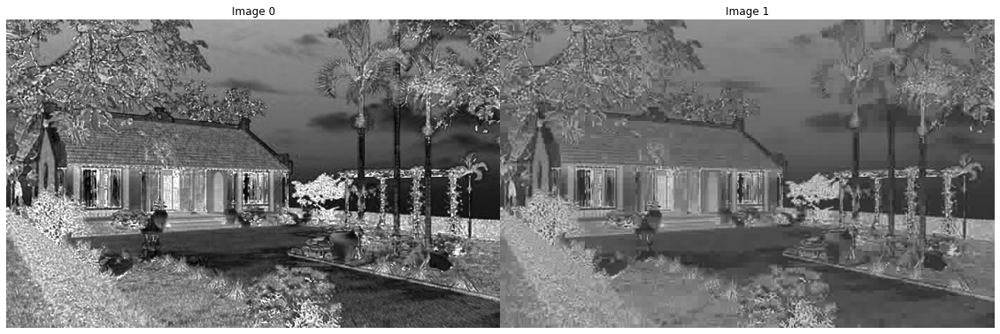

Color image recovery


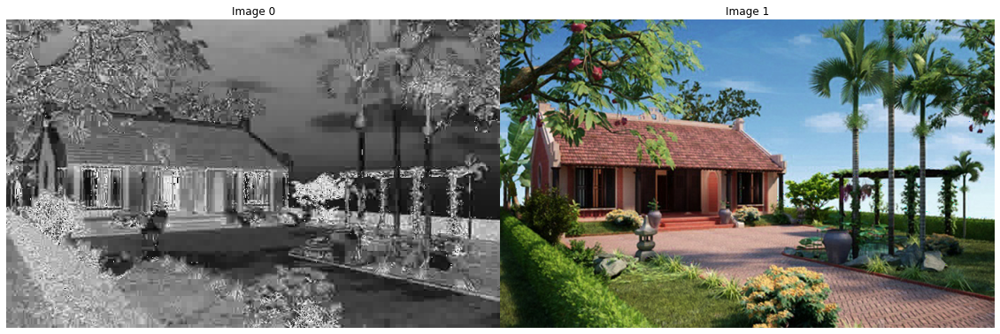

In [26]:
image_hsv= cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
CDT(image_hsv,1,0.043)

In [27]:
os.path.getsize("Nha.jpg")

174342

In [28]:
os.path.getsize("Anh_Nen/AnhNen_CDT_S.jpg")

161997

In [29]:
size_old=os.path.getsize("Nha.jpg")
size_new=os.path.getsize("Anh_Nen/AnhNen_CDT_S.jpg")
print(f"Dung luong cua anh goc: {size_old}")
print(f"Dung luong anh moi: {size_new}")
print(f"So dung luong giam {size_old-size_new} byte")

Dung luong cua anh goc: 174342
Dung luong anh moi: 161997
So dung luong giam 12345 byte


Sau khi dung CDT để nén ảnh trên kênh HSV thì khi nén trên kênh V là hiêu quả nhất. Các kênh H,S có giảm nhưng giảm ít

______________________________________________________________________________________________________

### Thực hiện nén các ảnh dùng DFT bằng cách giữ lại 5% hệ số

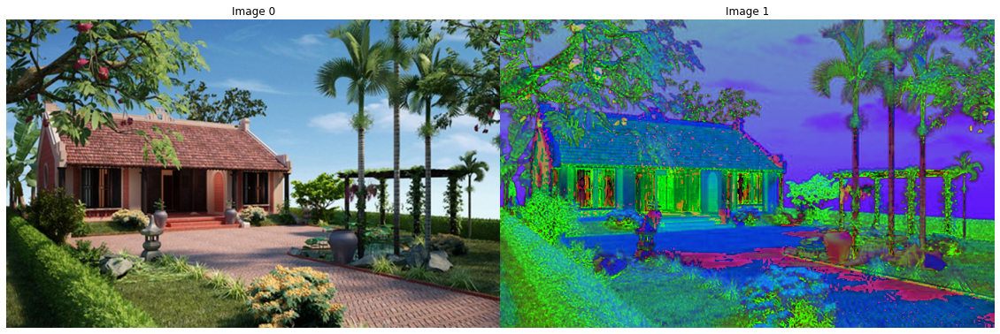

In [30]:

image= imread("Nha.jpg")
image_hsv= cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
ShowImage([image,image_hsv[:,:,:]],1,2)

In [31]:
def DFT(image_hsv, chanel, thresh):
    
    im = image_hsv[:,:,chanel]
    imsize = im.shape

    dft = np.zeros(imsize,dtype='complex');
    im_dft = np.zeros(imsize,dtype='complex');

    # 8x8 DFT
    for i in np.r_[:imsize[0]:8]:
        for j in np.r_[:imsize[1]:8]:
            dft[i:(i+8),j:(j+8)] = np.fft.fft2( im[i:(i+8),j:(j+8)] )

    # Thresh
#     thresh = 0.03
    dft_thresh = dft * (abs(dft) > (thresh*np.max(abs(dft))))


    percent_nonzeros_dft = np.sum( dft_thresh != 0.0 ) / (imsize[0]*imsize[1]*1.0)
    print("Keeping only %f%% of the DFT coefficients" % (percent_nonzeros_dft*100.0))

    # 8x8 iDFT
    for i in np.r_[:imsize[0]:8]:
        for j in np.r_[:imsize[1]:8]:
            im_dft[i:(i+8),j:(j+8)] = np.fft.ifft2( dft_thresh[i:(i+8),j:(j+8)] )
            
    print("Comparison between original and DFT compressed images" )
    ShowImage([im,  abs(im_dft)], 1, 2)
    
    
    image_hsv[:,:,chanel]=abs(im_dft)
    img_RGB = cv2.cvtColor(image_hsv, cv2.COLOR_HSV2RGB)
    
    print("Color image recovery")
    ShowImage([im, img_RGB])
    if chanel==0:
        path="Anh_Nen/AnhNen_DFT_H.jpg"
    elif chanel==1:
        path="Anh_Nen/AnhNen_DFT_S.jpg"
    else:
        path="Anh_Nen/AnhNen_DFT_V.jpg"

    cv2.imwrite(path, cv2.cvtColor(img_RGB,cv2.COLOR_RGB2BGR))

#### Nén các ảnh  dùng DFT ở kênh H

Keeping only 5.811376% of the DFT coefficients
Comparison between original and DFT compressed images


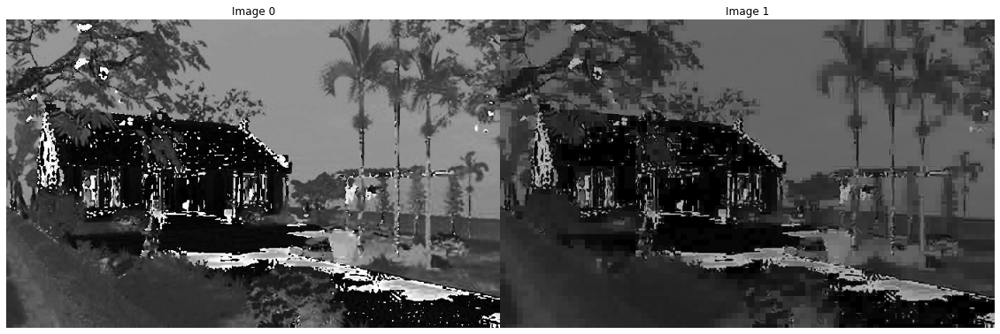

Color image recovery


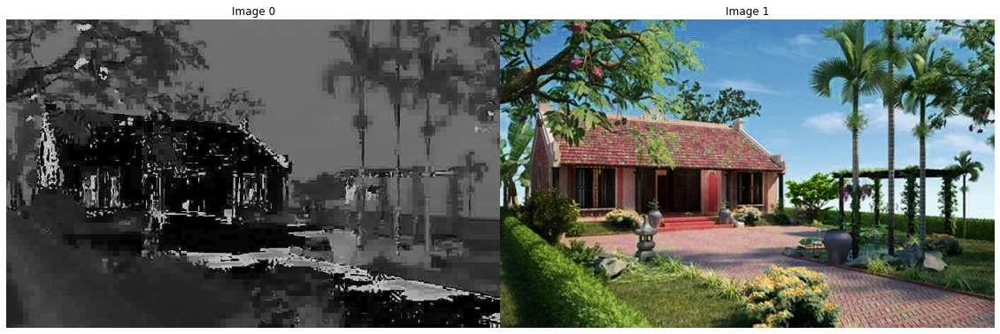

In [32]:
image_hsv= cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
DFT(image_hsv,0,0.04)

In [33]:
size_old=os.path.getsize("Nha.jpg")
size_new=os.path.getsize("Anh_Nen/AnhNen_DFT_H.jpg")
print(f"Dung luong cua anh goc: {size_old}")
print(f"Dung luong anh moi: {size_new}")
print(f"So dung luong giam: {size_old-size_new} byte")

Dung luong cua anh goc: 174342
Dung luong anh moi: 170249
So dung luong giam: 4093 byte


#### Nén các ảnh  dùng DFT ở kênh S

Keeping only 5.379209% of the DFT coefficients
Comparison between original and DFT compressed images


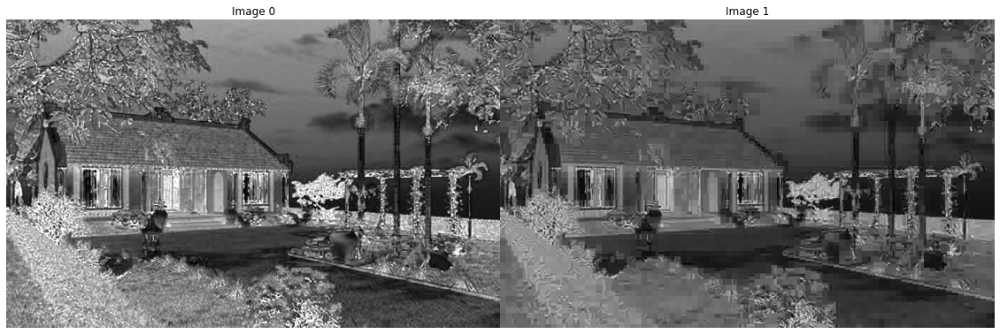

Color image recovery


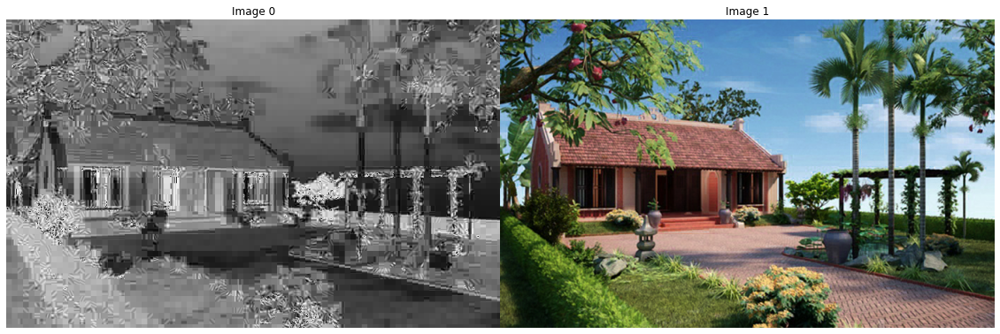

In [34]:
image_hsv= cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
DFT(image_hsv,1,0.042)

In [35]:
size_old=os.path.getsize("Nha.jpg")
size_new=os.path.getsize("Anh_Nen/AnhNen_DFT_S.jpg")
print(f"Dung luong cua anh goc: {size_old}")
print(f"Dung luong anh moi: {size_new}")
print(f"So dung luong giam: {size_old-size_new} byte")

Dung luong cua anh goc: 174342
Dung luong anh moi: 161613
So dung luong giam: 12729 byte


#### Nén các ảnh dùng DFT ở kênh V

Keeping only 5.225891% of the DFT coefficients
Comparison between original and DFT compressed images


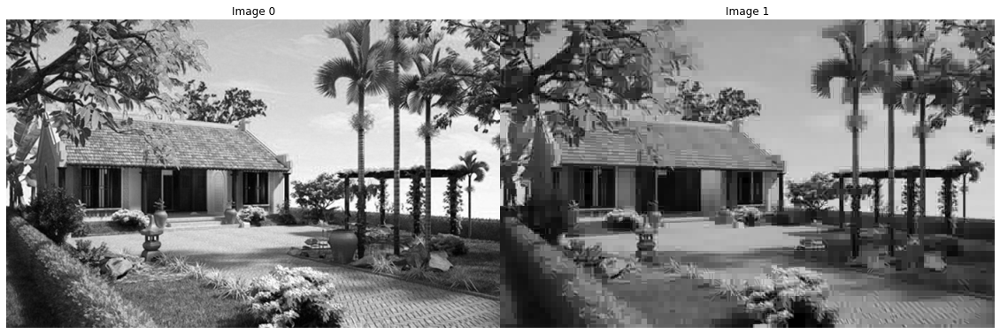

Color image recovery


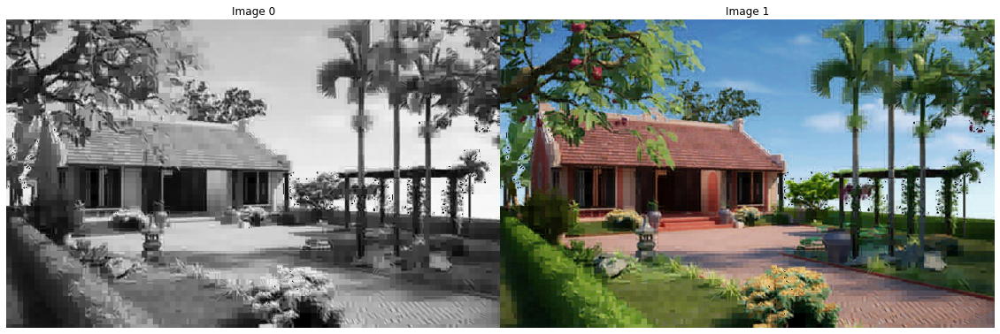

In [36]:
image_hsv= cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
DFT(image_hsv,2,0.036)

In [37]:
size_old=os.path.getsize("Nha.jpg")
size_new=os.path.getsize("Anh_Nen/AnhNen_DFT_V.jpg")
print(f"Dung luong cua anh goc: {size_old}")
print(f"Dung luong anh moi: {size_new}")
print(f"So dung luong giam: {size_old-size_new} byte")

Dung luong cua anh goc: 174342
Dung luong anh moi: 121484
So dung luong giam: 52858 byte


Khi dùng DFT để nén giữ lại 5 % hệ số trên kênh màu HSV thì kênh V giảm đáng kể, các kênh còn lại giảm ít.

_________________________________________________________________________________________________